# Pip

Allways good to keep pip up to date

In [1]:
# !pip install --upgrade pip

# Xcode
Xcode is not a python library, but it is required by many installations when working on a mac. You can download it for free from the appstore

In [2]:
# Go to AppStore

# Spacy
Spacy is an excellent library for easy and fast nlp.

It's various pre-trained models are great at getting quick results including entity recognition, word vectorization, semantic tagging and sentiment analysis.

Annoyingly it requires Xcode installed, so you have to be patient if setting it up from scratch.

In [3]:
# !pip install spacy
# !python -m spacy download en # <- basic english pre-trained model 
# Other spacy pre-trained models: https://spacy.io/usage/models

In [8]:
# !pip install spacy

In [28]:
# Example
import spacy
nlp = spacy.load('en')

raw_text = """But Google is starting from behind. The company made a late push
into hardware, and Apple’s Siri, available on iPhones, and Amazon’s Alexa
software, which runs on its Echo and Dot devices, have clear leads in
consumer adoption."""

spacy_text = nlp(raw_text)
spacy.displacy.render(spacy_text, style='ent', jupyter=True)

# Missingno

An amazing visualization library for missing numbers.

In particualar:

    msgn.matrix(df) <- Location in the dataframe of the missing values
    msgn.bar(df) <- Tally of missing values by column
    msgn.heatmap(df) <- Shows correlations in "being missing"

In [16]:
#!pip install missingno

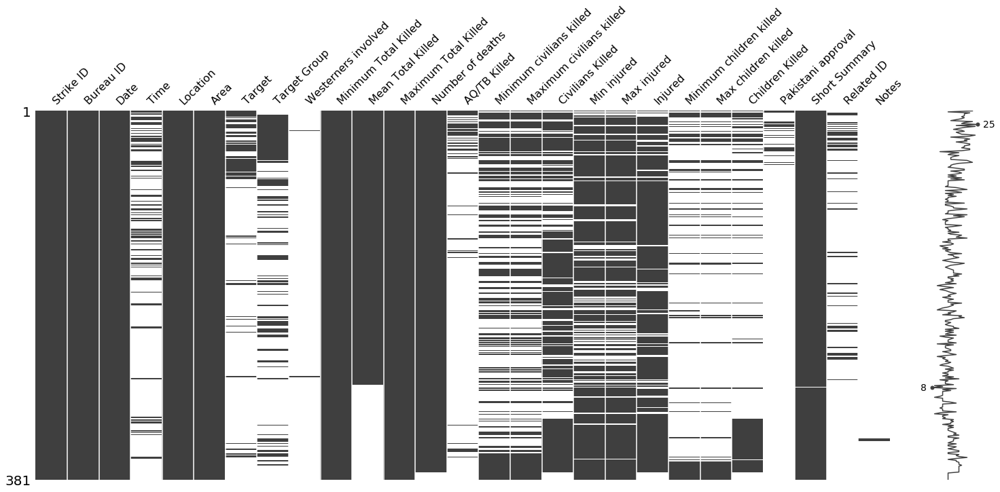

In [7]:
# Example
import missingno as msgn
import pandas as pd
import matplotlib.pyplot as plt

%matplotlib inline

data = pd.read_csv('https://raw.githubusercontent.com/mkleinbort/resource-datasets/master/drone_strikes/drones.csv', encoding='latin')
msgn.matrix(data)

# Plotly
Good for interactive (and 3D) visualizations.

Good article: https://medium.com/@plotlygraphs/introducing-plotly-py-3-0-0-7bb1333f69c6

In [8]:
# !pip install plotly

In [1]:
# In jupyter labs you need to set up a few things to have the javascript-powered plotly visualizationbs work in the notebook

# Set up Brew
# run this in shell---> /usr/bin/ruby -e "$(curl -fsSL https://raw.githubusercontent.com/Homebrew/install/master/install)"

# Set up Node-js
# run this in shell---> brew install node
# run this in shell---> jupyter labextension install @jupyterlab/plotly-extension

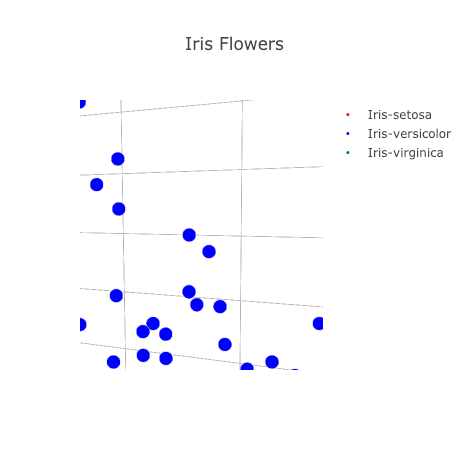

In [1]:
import pandas as pd
import plotly.offline as py
import plotly.graph_objs as go


py.init_notebook_mode(connected=False)

data = pd.read_csv('https://raw.githubusercontent.com/mkleinbort/resource-datasets/master/iris/iris.csv', encoding='latin')

def make_scatter(flowername, color, data=data):
    
    ans =  go.Scatter3d(name=flowername,
                x = data.query(f'Name == "{flowername}"')['PetalLength'],
                y = data.query(f'Name == "{flowername}"')['PetalWidth'],
                z = data.query(f'Name == "{flowername}"')['SepalLength'],
                mode = 'markers',
                marker = {
                    'color':color,
                    'line' : {'width':10,
                              'color':'white'}
                })
    return ans

traces = [make_scatter(flowername, color) for flowername, color in zip(data['Name'].unique(), ['red','blue','green'])]

layout = go.Layout(title="Iris Flowers")

py.iplot(go.FigureWidget(data=traces, layout=layout))

# Scikit-Plot

Really usefull fast visualizations for ML

Some examples at the github page: https://github.com/reiinakano/scikit-plot

In [18]:
# !pip install scikit-plot

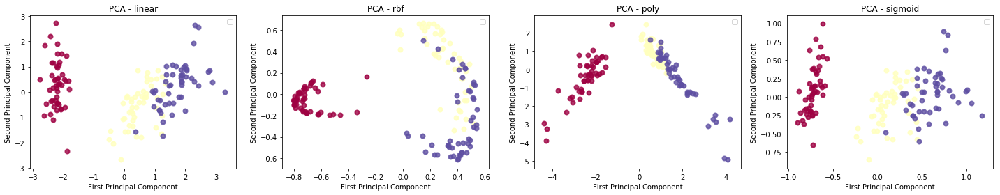

In [78]:
import pandas as pd
import matplotlib.pyplot as plt

from sklearn.decomposition import PCA, KernelPCA
from sklearn.preprocessing import StandardScaler
from scikitplot.decomposition import plot_pca_2d_projection

# Iris dataset
data = pd.read_csv('https://raw.githubusercontent.com/mkleinbort/resource-datasets/master/iris/iris.csv', encoding='latin')

ss = StandardScaler()
X_raw = data.drop('Name', axis=1)
X_normed =  ss.fit_transform(X_raw)
y = data['Name']

pca1 = PCA() # you could use KernelPCA with a linear kernel, but this implementation is much much faster.
pca2 = KernelPCA(kernel='rbf')
pca3 = KernelPCA(kernel='poly')
pca4 = KernelPCA(kernel='sigmoid')

pca1.fit(X_normed)
pca2.fit(X_normed)
pca3.fit(X_normed)
pca4.fit(X_normed)

fig, axes = plt.subplots(nrows=1, ncols=4)
fig.set_figwidth(20)
plot_pca_2d_projection(pca1, X_normed, y, ax=axes[0], title='PCA - linear')
plot_pca_2d_projection(pca2, X_normed, y, ax=axes[1], title='PCA - rbf')
plot_pca_2d_projection(pca3, X_normed, y, ax=axes[2], title='PCA - poly')
plot_pca_2d_projection(pca4, X_normed, y, ax=axes[3], title='PCA - sigmoid')

for ax in axes:
    ax.legend([])
    
plt.tight_layout()

# UMAP

Have you used PCA? Great, PCA is great, and KernelPCA gives you flexibility. But if you are willing to throw explainability out a 10th floor window, UMAP is very very good. It is based on similar mathematics to t-SNE put allows you to do inference in production, semi supervised-learning, and it is orders of magnitude faster to train.

In [1]:
# !pip install umap-learn

In [3]:
from umap import UMAP
from sklearn.datasets import load_digits

import pandas as pd
import matplotlib.pyplot as plt

from sklearn.decomposition import PCA, KernelPCA
from sklearn.preprocessing import StandardScaler
from sklearn.datasets import load_digits

from scikitplot.decomposition import plot_pca_2d_projection

# MNIST dataset
data = load_digits()
X = pd.DataFrame(data['data'])
y = pd.Series(data['target'])


ss = StandardScaler()
X_normed =  ss.fit_transform(X)

In [3]:
%%time

pca1 = PCA() # you could use KernelPCA with a linear kernel, but this implementation is much much faster.
pca2 = KernelPCA(kernel='rbf')
pca3 = KernelPCA(kernel='sigmoid')

pca1.fit(X_normed)
pca2.fit(X_normed)
pca3.fit(X_normed)

CPU times: user 6.63 s, sys: 171 ms, total: 6.8 s
Wall time: 1.96 s


In [8]:
%%time

# The amount of hyperparameters here is near silly, have fun
umap1 = UMAP()
umap2 = UMAP(n_neighbors=15, local_connectivity=1000, min_dist=1, spread=1, repulsion_strength=.5)
umap3 = UMAP(n_neighbors=15, local_connectivity=1000, min_dist=1, spread=1, repulsion_strength=.5)

umap1.fit(X_normed)
umap2.fit(X_normed)
umap3.fit(X_normed, y) # Umap can also be used as a semi-supervised learning method

CPU times: user 23.3 s, sys: 1.46 s, total: 24.7 s
Wall time: 19.6 s


CPU times: user 1.79 s, sys: 58.1 ms, total: 1.84 s
Wall time: 517 ms


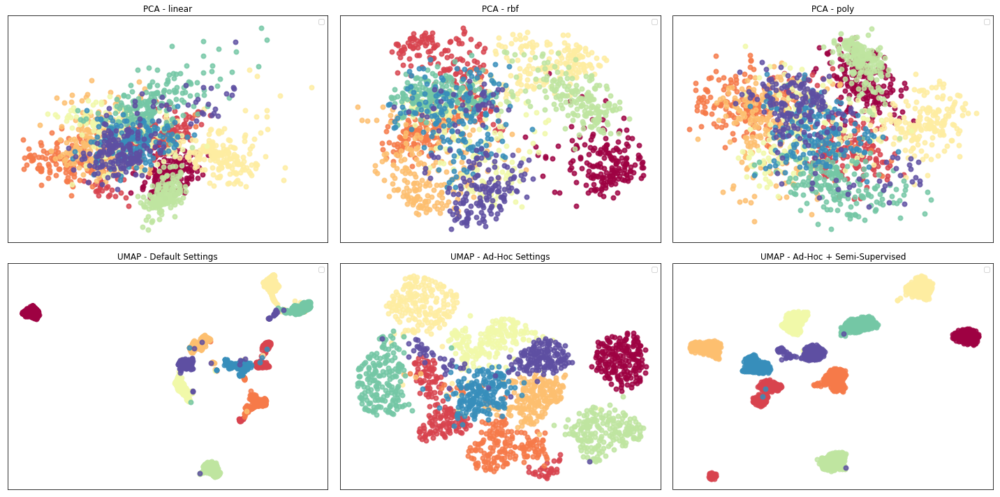

In [10]:
%%time

fig, axes = plt.subplots(nrows=2, ncols=3)
fig.set_figwidth(20)
fig.set_figheight(10)

plot_pca_2d_projection(pca1, X_normed, y, ax=axes[0,0], title='PCA - linear')
plot_pca_2d_projection(pca2, X_normed, y, ax=axes[0,1], title='PCA - rbf')
plot_pca_2d_projection(pca3, X_normed, y, ax=axes[0,2], title='PCA - poly')

plot_pca_2d_projection(umap1, X_normed, y, ax=axes[1,0], title='UMAP - Default Settings')
plot_pca_2d_projection(umap2, X_normed, y, ax=axes[1,1], title='UMAP - Ad-Hoc Settings')
plot_pca_2d_projection(umap3, X_normed, y, ax=axes[1,2], title='UMAP - Ad-Hoc + Semi-Supervised')

for ax in axes.ravel():
    ax.legend([])
    ax.set_xticks([])
    ax.set_yticks([])
    ax.set_xlabel('')
    ax.set_ylabel('')
    
plt.tight_layout()

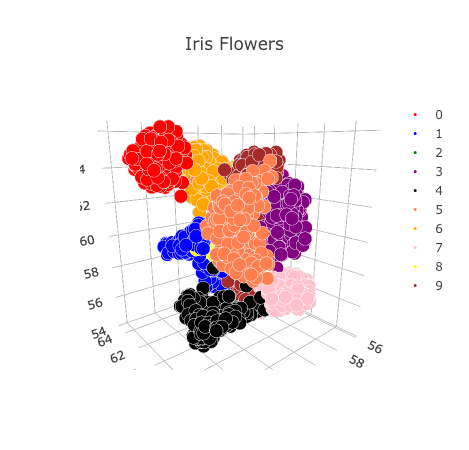

In [14]:
# Just for fun:

import plotly.offline as py
import plotly.graph_objs as go



py.init_notebook_mode(connected=False)

umap = UMAP(n_components=3,
            n_neighbors=15, 
            local_connectivity=1000, 
            min_dist=1, 
            spread=1, 
            repulsion_strength=.5)

X_reduced = umap.fit_transform(X_normed) # This is 100% unsupervised

df = pd.DataFrame(X_reduced, columns=[0,1,2])
df['digit'] = y

def make_scatter(digit, color, data=data):
    
    ans =  go.Scatter3d(name=digit,
                x = data.query(f'digit == "{digit}"')[0],
                y = data.query(f'digit == "{digit}"')[1],
                z = data.query(f'digit == "{digit}"')[2],
                mode = 'markers',
                text = digit,
                marker = {
                    'color':color,
                    'line' : {'width':10,
                              'color':'white'}
                })
    return ans

traces = [make_scatter(digit, color, data=df) 
          for digit, color in 
          zip(range(10),['red','blue','green','purple','black',
                         'coral','orange','pink','yellow','brown'])]

layout = go.Layout(title="Iris Flowers")

py.iplot(go.FigureWidget(data=traces, layout=layout))

# HDBSCAN

My personal opinion on clustering algorithms:


Algorithm | Likely to not be nonesense | Likely to actually work
---|---|---
k-means	| Not everythin is a sphere	| Great for placing fireman stations, but limited general use
algomerative clustering	| It works too often, even when it should not | yes, often, it can be good
dbscan	| Great! When working with very well defined distance metrics in low dimensional space | can do non spherical clusters, that's a big plus
hdbscan	| Yes | Not sure 

In [1]:
# !pip install hdbscan

In [2]:
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import seaborn as sns

source = 'https://raw.githubusercontent.com/mkleinbort/resource-datasets/master/blobs/'

flame = pd.read_csv(f'{source}/flame.csv')
agg = pd.read_csv(f'{source}/aggregation.csv')
comp = pd.read_csv(f'{source}/compound.csv')
jain = pd.read_csv(f'{source}/jain.csv')
path = pd.read_csv(f'{source}/pathbased.csv')
r15 = pd.read_csv(f'{source}/r15.csv')
spiral = pd.read_csv(f'{source}/spiral.csv')

datasets = [flame, agg, comp, jain, path, r15, spiral]
dataset_names = ['flame', 'agg', 'comp', 'jain', 'path', 'r15', 'spiral']

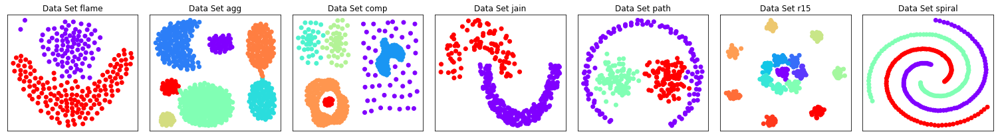

In [3]:
# Plotting the datasets with the subjectively "ideal" labels

def plot_datasets(data_sets, dset_names = dataset_names):
    '''Plots the n datasets in one row'''
    n = len(data_sets)
    plt.figure(figsize=(n*3,3))
    for i, dset in enumerate(data_sets):
        plt.subplot(1, n, i+1)
        plt.scatter(dset['x'],dset['y'], c=dset['label'], cmap='rainbow')
        plt.title('Data Set {}'.format(dset_names[i]))
        plt.xticks([])
        plt.yticks([])
    
    plt.tight_layout()
    plt.show()
    
plot_datasets(datasets)

In [14]:
from sklearn.cluster import KMeans, AgglomerativeClustering, DBSCAN
from hdbscan import HDBSCAN

In [19]:
%config InlineBackend.figure_format = 'retina'

def getplots(algorithms:list, dsets:list, dset_names:list=[]):
    '''
    Visualizer of every algorithm against every dataset
    
    args:
    -----
    algorithms:list
        A list of (clustering) estimators implementing the .fit_predict() method,
        
    datasets:list
        A list of pandas dataframes with columns 'x' and 'y'
    '''
    
    m,n = len(algorithms), len(dsets)
    fig, axes = plt.subplots(nrows=m, ncols=n+2)
    fig.set_figwidth(3*(n+2)) # the +2 is to fit the algorithm name and parameters
    fig.set_figheight(3*m)
    
    # Plot the algorithm names and their parameters:
    for i, alg in enumerate(algorithms):
            
            alg_name = str(alg).split('(')[0]
            alg_params = str(alg.get_params()).strip('{}').replace(', ','\n')
            
            # Plot the name of the algorithm
            axes[i, 0].text(x=0.5, y=0.5, s=alg_name, 
                            va='center', ha='center', 
                            fontsize=18, rotation=45)
            
            # Plot the parameters
            axes[i, -1].text(x=0, y=0.5, s=alg_params, va='center')
            axes[i, -1].axis('off')
                            
    # Plot the outcome of the algorithm on each dataset:
    for i, alg in enumerate(algorithms):
        for j, dset in enumerate(dsets):
            predi = alg.fit_predict(dset)
            axes[i, j+1].scatter(dset['x'],dset['y'], c=predi, cmap='rainbow')
            
        
    # Remove axis ticks 
    for ax in axes.ravel():
        ax.set_xticks([])
        ax.set_yticks([])
    
    # Add titles to the first row:
    axes[0,0].set_title('Algorithm', fontsize=20)
    axes[0,-1].set_title('Parameters', fontsize=20)
    for i, dataset_name in enumerate(dset_names):
        axes[0,i+1].set_title(dataset_name.capitalize(), fontsize=20)

    # Lastly
    plt.tight_layout()

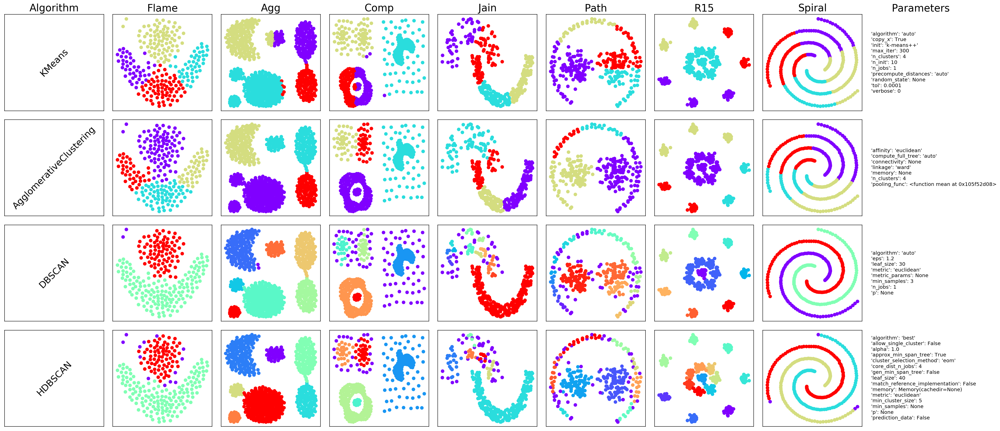

In [20]:
getplots([KMeans(n_clusters=4),
          AgglomerativeClustering(n_clusters=4),
          DBSCAN(eps=1.2, min_samples=3), # After a little tuning this works really well
          HDBSCAN()],  # With no tunning this works really well
         
         dsets=datasets,
         dset_names=dataset_names)

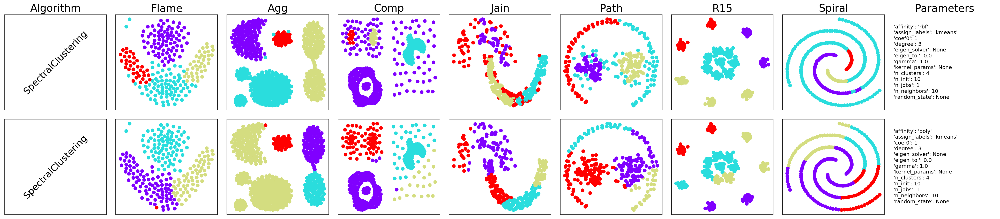

In [27]:
from sklearn.cluster import SpectralClustering, 

getplots([SpectralClustering(n_clusters=4, affinity='rbf'),
          SpectralClustering(n_clusters=4, affinity='poly')],
         
         dsets=datasets,
         dset_names=dataset_names)

# Selenium

Disclamer: THIS IS NOT FAST!!!

Selenium allows to make a "robot hand" that can interact with a browser and do things in the internet.

In [30]:
# !pip install selenium
# you will also need a webdriver, such as -> http://chromedriver.chromium.org/downloads

In [42]:
# Example 
from selenium import webdriver
import time

browser = webdriver.Chrome(executable_path='/Users/mkleinbort/chromedriver')

try:
    browser.get('https://xkcd.com/') # go to this website
    
    for i in range(5):
        time.sleep(3) # wait a few seconds 
        go_to_random_commic_button = browser.find_element_by_partial_link_text('Random')
        go_to_random_commic_button.click() 
except:
    print('Something went wrong')
finally:
    print('Done!')
    browser.quit()

Done!


# Geopandas



In [1]:
# !pip install geopandas

In [27]:
import geopandas as gpd
import matplotlib.pyplot as plt

df = gpd.read_file('data/Land Registry Data Sample.shp')
df.head()

,POLY_ID,TITLE_NO,INSERT,UPDATE,REC_STATUS,geometry
0,19786272,AV7150,2016-02-05T13:36:16,2016-02-05T13:36:16,A,"POLYGON ((360198.8 176554.8, 360202.15 176558...."
1,19786811,BL20923,2016-02-05T13:36:16,2016-02-05T13:36:16,A,"POLYGON ((360234.8 174541.45, 360231.1 174548...."
2,19786826,BL62485,2016-02-05T13:36:16,2016-02-05T13:36:16,A,"POLYGON ((360213.2 175737.8, 360217.6 175742, ..."
3,19786694,AV22992,2016-02-05T13:36:16,2016-02-05T13:36:16,A,"POLYGON ((360220.15 174477.95, 360217.55 17448..."
4,19787285,BL114345,2016-02-05T13:36:16,2016-02-05T13:36:16,A,"POLYGON ((360234.3 174675.15, 360230.05 174679..."


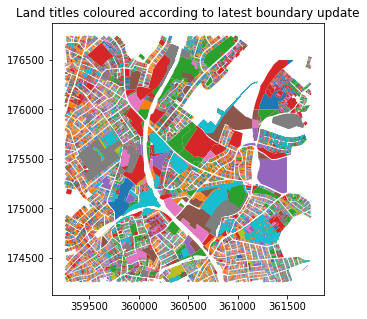

In [37]:
ax = df.plot(column='UPDATE', figsize=(5,5))
ax.set_title('Land titles coloured according to latest boundary update')
plt.show()

# Geopy

Easy geospacial lookup

In [38]:
# !pip install geopy

In [39]:
from geopy.geocoders import Nominatim

geocoder = Nominatim(user_agent='Example use of Nominatim')

In [40]:
geocoder.geocode('The Washington Monument')

Location(Washington Monument, 1601, Independence Avenue Southwest, Penn Quarter, Washington, D.C., 20560, USA, (38.8894737, -77.03524965, 0.0))

In [41]:
geocoder.geocode('40 Holborn Viaduct')

Location(40, Holborn Viaduct, Temple, City of London, London, Greater London, England, EC4A 3AF, UK, (51.5177885, -0.1066908, 0.0))

In [42]:
geocoder.reverse("51.4963, -0.1764")

Location(Natural History Museum, Cromwell Road, Brompton, Royal Borough of Kensington and Chelsea, London, Greater London, England, SW7 2DG, UK, (51.4963342, -0.176466289499681, 0.0))

# Faker

In [4]:
# !pip install faker

In [63]:
from faker import Faker
import pandas as pd

fake = Faker()

def generate_person():
    person = dict(
        SendingCompanyIN = fake.license_plate(),
        Country = fake.country_code(),
        FreeText = fake.text(),
        Contact = fake.email(),
        MessageRefID = fake.numerify(),

        ReportingPeriod = fake.date_between('-3y', '-1y'),
        Timestamp = fake.unix_time(),

        Name = fake.name(),
        Address = fake.address(),
        Nationality = fake.country(),
        BirthInfo = fake.date_of_birth(),
        Title = fake.prefix()
    )
    
    return person

df = pd.DataFrame([generate_person() for _ in range(5)])
df.head(2)

,Address,BirthInfo,Contact,Country,FreeText,MessageRefID,Name,Nationality,ReportingPeriod,SendingCompanyIN,Timestamp,Title
0,"5825 Julie Island Suite 350\nMichelleburgh, TN...",1929-05-08,bryan87@washington.com,NE,Physical seek live training. Brother society d...,353,Nicole Thomas,Belarus,2016-12-10,4RL04,1349221044,Dr.
1,"14875 Thompson Heights\nDonaldbury, GA 21835",2010-02-21,rsullivan@gmail.com,UG,Represent call than either coach figure candid...,807,Elizabeth Taylor,Brazil,2017-08-26,H48 9FP,643761418,Mrs.


# Translate

In [8]:
# !pip install py_translator

In [11]:
# Excample
from py_translator import Translator

translator = Translator()
output = translator.translate('Hello World!', dest='fr')

output.text

'Bonjour le monde!'

# Code linting

In [29]:
# !pip install flake8
# !pip install pycodestyle
# !pip install pycodestyle_magic

%load_ext pycodestyle_magic

The pycodestyle_magic extension is already loaded. To reload it, use:
  %reload_ext pycodestyle_magic


In [66]:
%%pycodestyle


# flake8 compliant code
def fibb(n=3):
    if n == 0 or n == 1:
        return 1
    else:
        return fibb(n-1)+fibb(n-2)

# docx

In [69]:
# !pip install python-docx

In [117]:
# Example
from docx import Document
from docx.shared import Inches

from skimage.data import coffee
from io import BytesIO

document = Document()

document.add_heading('Document Title', 0)

p = document.add_paragraph('A plain paragraph having some ')
p.add_run('bold').bold = True
p.add_run(' and some ')
p.add_run('italic.').italic = True

document.add_heading('Heading, level 1', level=1)
document.add_paragraph('Intense quote', style='Intense Quote')

document.add_paragraph(
    'first item in unordered list', style='List Bullet'
)
document.add_paragraph(
    'first item in ordered list', style='List Number'
)

buffer = BytesIO()
image_of_coffee = Image.fromarray(coffee())
image_of_coffee.save(buffer, format='png')
document.add_picture(buffer, width=Inches(1.25))

records = (
    (3, '101', 'Spam'),
    (7, '422', 'Eggs'),
    (4, '631', 'Spam, spam, eggs, and spam')
)

table = document.add_table(rows=1, cols=3)
hdr_cells = table.rows[0].cells
hdr_cells[0].text = 'Qty'
hdr_cells[1].text = 'Id'
hdr_cells[2].text = 'Desc'
for qty, id, desc in records:
    row_cells = table.add_row().cells
    row_cells[0].text = str(qty)
    row_cells[1].text = id
    row_cells[2].text = desc

document.add_page_break()

document.save('demo.docx')

# Facebook Prophet

In [7]:
 # !pip install fbprophet

In [57]:
import pandas as pd
import matplotlib.pyplot as plt

import warnings
warnings.filterwarnings('ignore')

data = pd.read_csv('https://raw.githubusercontent.com/facebook/prophet/master/examples/example_wp_log_peyton_manning.csv')
data.head()

,ds,y
0,2007-12-10,9.590761
1,2007-12-11,8.519590
2,2007-12-12,8.183677
3,2007-12-13,8.072467
4,2007-12-14,7.893572


In [61]:
from fbprophet import Prophet

model = Prophet()

model.fit(data)

future = model.make_future_dataframe(periods=365*3, include_history=False) # Three years!!!
future.head()

INFO:fbprophet.forecaster:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


,ds
0,2016-01-21
1,2016-01-22
2,2016-01-23
3,2016-01-24
4,2016-01-25


In [62]:
predictions = model.predict(future)
predictions.head()

,ds,trend,yhat_lower,yhat_upper,trend_lower,trend_upper,additive_terms,additive_terms_lower,additive_terms_upper,weekly,weekly_lower,weekly_upper,yearly,yearly_lower,yearly_upper,multiplicative_terms,multiplicative_terms_lower,multiplicative_terms_upper,yhat
0,2016-01-21,7.558493,7.917211,9.149225,7.558493,7.558493,0.999819,0.999819,0.999819,-0.072254,-0.072254,-0.072254,1.072073,1.072073,1.072073,0.0,0.0,0.0,8.558312
1,2016-01-22,7.557465,7.993348,9.189383,7.557465,7.557465,1.016808,1.016808,1.016808,-0.069578,-0.069578,-0.069578,1.086386,1.086386,1.086386,0.0,0.0,0.0,8.574273
2,2016-01-23,7.556437,7.716088,8.953763,7.556437,7.556437,0.786528,0.786528,0.786528,-0.311713,-0.311713,-0.311713,1.098241,1.098241,1.098241,0.0,0.0,0.0,8.342965
3,2016-01-24,7.555410,8.055011,9.306341,7.555410,7.555410,1.155519,1.155519,1.155519,0.048276,0.048276,0.048276,1.107243,1.107243,1.107243,0.0,0.0,0.0,8.710929
4,2016-01-25,7.554382,8.422543,9.635745,7.554382,7.554382,1.465276,1.465276,1.465276,0.352295,0.352295,0.352295,1.112981,1.112981,1.112981,0.0,0.0,0.0,9.019658


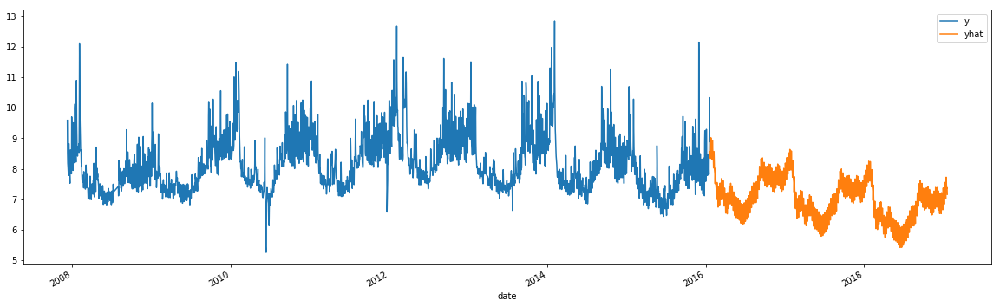

In [88]:
# plotting the historical data (in blue)
ax = (data
      .assign(date=lambda x: pd.to_datetime(x['ds']))
      .plot(x='date',y='y', figsize=(20,6))
     )

# plotting the forecasted data
(predictions
      .assign(date=lambda x: pd.to_datetime(x['ds']))
      .plot(x='date',y='yhat', ax=ax)
)


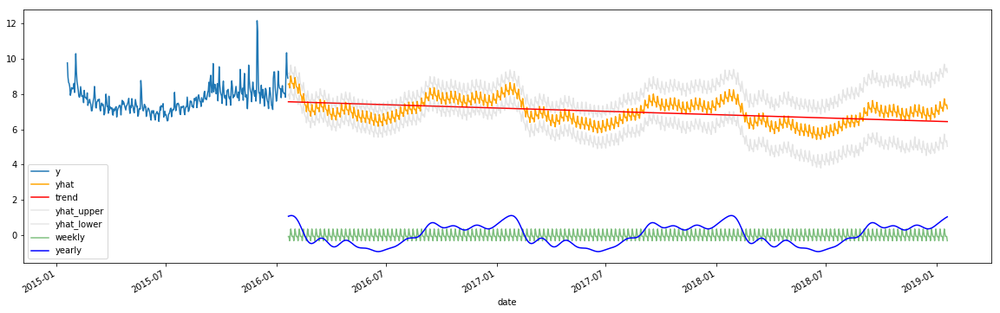

In [85]:
# plotting the various components of the prediction

ax = (data
      .assign(date=lambda x: pd.to_datetime(x['ds']))
      .tail(365)
      .plot(x='date',y='y', figsize=(20,6))
     )

df = predictions.assign(date=lambda x: pd.to_datetime(x['ds']))

# Predictions
df.plot(x='date',y='yhat', color='orange', ax=ax)

# Trend
df.plot(x='date',y='trend', color='red', ax=ax)

# Upper and Lower Estimates (the model is 95% confident the true value will be between these)
df.plot(x='date',y='yhat_upper', color='gray', ax=ax, alpha=0.2)
df.plot(x='date',y='yhat_lower', color='gray', ax=ax, alpha=0.2)

# The Weekly Pattern
df.plot(x='date',y='weekly', color='green', ax=ax, alpha=0.5)

# The yearly Pattern
df.plot(x='date',y='yearly', color='blue', ax=ax)
